# Tire Fitting

## Import Statements

In [75]:
include("../tires/mf_62_sym.jl")
include("../tires/parse_tir.jl")
include("../tires/parse_ttc.jl")
using Plots
using ModelingToolkit
using Latexify
using LinearAlgebra

## Load Initial Guess .TIR File

In [76]:
tir_filepath = "../parameters/R20_16x7p5_10_on_7in_12psi_PAC2002.tir"
model = parse_tir(tir_filepath)
fixed_param_map, param_map, scaling_map = build_param_maps(model)
display(fixed_param_map)

2-element Vector{Pair{Num, Float64}}:
 r0 => 0.2045
  g => -9.81

## Build MF Function and Constraints

In [77]:
mf_fun = ModelingToolkit.substitute.(MF62.output_vec, Ref(fixed_param_map))
mf_fun = ModelingToolkit.substitute.(mf_fun, Ref(scaling_map))

# Some code due to lack of inequality.jl substitution support
lhs = ModelingToolkit.substitute.(getproperty.(MF62.constraints,:lhs), Ref(fixed_param_map))
lhs = ModelingToolkit.substitute.(lhs, Ref(scaling_map))
rhs = ModelingToolkit.substitute.(getproperty.(MF62.constraints,:rhs), Ref(fixed_param_map))
rhs = ModelingToolkit.substitute.(rhs, Ref(scaling_map))
mf_constraints = Inequality.(lhs, rhs, getproperty.(MF62.constraints, :relational_op))

14-element Vector{Inequality}:
 pcx1 ≳ 1.0e-8
 (fz*(1 - (gamma^2)*pdx3)*(pdx1 + ((fz - fz0)*pdx2) / fz0)*(1 + ((p_i - p_io)*ppx3) / p_io + ppx4*(((p_i - p_io) / p_io)^2))) / (1 + 0.7060229852277856vs) ≳ 1.0e-8
 (pex1 + ((fz - fz0)*pex2) / fz0 + pex3*(((fz - fz0) / fz0)^2))*(1 - pex4*sign(phx1 + ((fz - fz0)*phx2) / fz0 + (-vs*cos(alpha)) / abs(rl*cos(alpha)*Ω))) ≲ 1
 pcy1 ≳ 1.0e-8
 (pey1 + ((fz - fz0)*pey2) / fz0)*(1 + (-pey3 - pey4*sin(gamma))*sign(phy1 + ((fz - fz0)*phy2) / fz0 + phy3*sin(gamma) + sign(rl*cos(alpha)*Ω)*tan(alpha)) + pey5*(sin(gamma)^2)) ≲ 1
 (qbz1 + ((fz - fz0)*qbz2) / fz0 + qbz3*(((fz - fz0) / fz0)^2))*(1 + qbz5*abs(sin(gamma)) + qbz6*(sin(gamma)^2))*(1 + 0.7060229852277856vs) ≳ 1.0e-8
 (qez1 + ((fz - fz0)*qez2) / fz0 + qez3*(((fz - fz0) / fz0)^2))*(1 + 0.6366197723675814(qez4 + qez5*sin(gamma))*atan((qbz1 + ((fz - fz0)*qbz2) / fz0 + qbz3*(((fz - fz0) / fz0)^2))*(1 + qbz5*abs(sin(gamma)) + qbz6*(sin(gamma)^2))*qcz1*(qhz1 + ((fz - fz0)*qhz2) / fz0 + (qhz3 + ((fz - fz0

## Load TTC Data

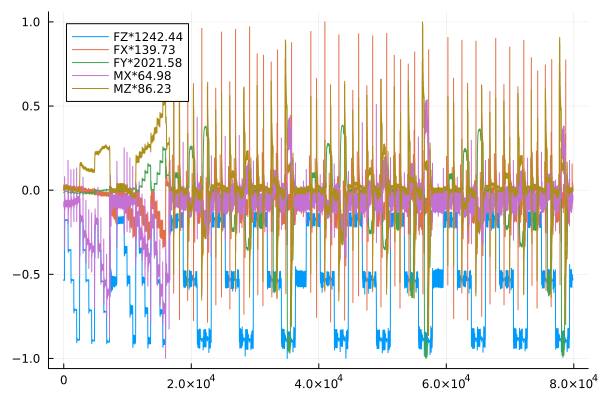

Row,ET,V,N,SA,IA,RL,RE,P,FX,FY,FZ,MX,MZ,NFX,NFY,RST,TSTI,TSTC,TSTO,AmbTmp,SR
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.03,-0.04,0.007,0.012,19.53,-209.45,82.51,2.1,-29.45,-666.36,-5.35,1.06,-0.0031,0.0442,26.97,26.34,26.27,27.22,25.57,-1.0932
2,0.01,0.03,0.03,-0.001,0.009,19.53,336.95,82.0,2.79,-30.1,-664.08,-5.95,1.23,-0.0042,0.0453,26.96,26.31,26.32,27.26,25.56,-0.942
3,0.02,0.01,0.03,-0.008,0.01,19.53,53.75,82.0,3.23,-30.81,-665.39,-5.62,1.27,-0.0049,0.0463,26.97,26.32,26.32,27.27,25.54,-0.6366
4,0.03,0.04,0.03,0.004,0.006,19.53,431.35,82.21,3.22,-30.06,-663.95,-5.76,1.25,-0.0049,0.0453,26.95,26.34,26.31,27.27,25.56,-0.9547
5,0.04,0.03,-0.04,-0.007,0.003,19.53,-209.45,82.76,2.96,-30.02,-664.67,-5.54,1.07,-0.0044,0.0452,26.96,26.4,26.32,27.26,25.57,-1.0933
6,0.05,0.03,-0.04,-0.007,-0.002,19.53,-209.45,83.22,-0.25,-27.88,-662.51,-5.47,0.27,0.0004,0.0421,26.95,26.37,26.29,27.27,25.56,-1.0933
7,0.06,0.04,0.03,0.004,0.017,19.53,431.35,83.07,2.51,-28.82,-661.82,-6.03,1.12,-0.0038,0.0435,26.95,26.32,26.25,27.27,25.55,-0.9547
8,0.07,0.02,0.03,-0.001,-0.003,19.53,242.55,82.76,2.1,-28.55,-663.1,-5.31,0.99,-0.0032,0.0431,26.94,26.31,26.24,27.27,25.56,-0.9195
9,0.08,0.03,0.09,0.012,0.009,19.53,93.37,82.31,0.03,-29.41,-662.76,-6.29,0.49,-0.0,0.0444,26.94,26.34,26.25,27.29,25.56,-0.7909


Row,FZ,IA,N,P,RL,SA,V
,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,666.36,0.00020944,-0.00418879,82510.0,0.1953,0.000122173,0.00833333
2,664.08,0.00015708,0.00314159,82000.0,0.1953,-1.74533e-5,0.00833333
3,665.39,0.000174533,0.00314159,82000.0,0.1953,-0.000139626,0.00277778
4,663.95,0.00010472,0.00314159,82210.0,0.1953,6.98132e-5,0.0111111
5,664.67,5.23599e-5,-0.00418879,82760.0,0.1953,-0.000122173,0.00833333
6,662.51,-3.49066e-5,-0.00418879,83220.0,0.1953,-0.000122173,0.00833333
7,661.82,0.000296706,0.00314159,83070.0,0.1953,6.98132e-5,0.0111111
8,663.1,-5.23599e-5,0.00314159,82760.0,0.1953,-1.74533e-5,0.00555556
9,662.76,0.00015708,0.00942478,82310.0,0.1953,0.00020944,0.00833333


Row,FX,FY,MX,MZ
,Float64,Float64,Float64,Float64
1,2.1,-29.45,-5.35,1.06
2,2.79,-30.1,-5.95,1.23
3,3.23,-30.81,-5.62,1.27
4,3.22,-30.06,-5.76,1.25
5,2.96,-30.02,-5.54,1.07
6,-0.25,-27.88,-5.47,0.27
7,2.51,-28.82,-6.03,1.12
8,2.1,-28.55,-5.31,0.99
9,0.03,-29.41,-6.29,0.49


TSTO - deg c
RE - cm
P - kPa
TSTC - deg c
AmbTmp - deg c
V - kph
RL - cm
FY - N
NFX - none
SA - deg
RST - deg c
SR - SAE
MZ - Nm
NFY - none
N - rpm
ET - s
FX - N
TSTI - deg c
MX - Nm
FZ - N
IA - deg


In [78]:
ttc_file = "../parameters/B2356raw2.dat"
ttc_df, ttc_dict = parse_ttc(ttc_file)
ttc_keys = ["FZ","FX","FY","MX","MZ"]
# for item in ttc_dict println(string(item[1]," - ",item[2])) end
# println("[UNITS]")
for item in ttc_dict["units"] println(string(item[1]," - ",item[2])) end
p = plot()
for key in ttc_keys
    scale = maximum(abs.(ttc_df[!,key]))
    p = plot!(ttc_df[!,key]/scale, label=string(key,"*",scale))
end
display(plot(p))
display(ttc_df)
# Manual units #TODO
input_scale_dict = Dict(:N => pi/30,
                        :V => 1/(3.6),
                        :FZ => -1,
                        :SA => pi/180,
                        :RL => 0.01,
                        :P => 1000,
                        :IA => pi/180)
ttc_inputs = DataFrame(
    Dict(col => ttc_df[!, col] .* input_scale_dict[col] for col in keys(input_scale_dict))
)

output_scale_dict = Dict(:FX => 1,
                        :FY => 1,
                        :MZ => 1,
                        :MX => 1)
ttc_outputs = DataFrame(
    Dict(col => ttc_df[!, col] .* output_scale_dict[col] for col in keys(output_scale_dict))
)
display(ttc_inputs)
display(ttc_outputs)

In [107]:
using Statistics: mean
# function cost_fun(p)
#     cost = LinearAlgebra.norm(substitute.(Ref(mf_fun),p) .- Array(ttc_outputs))
#     return cost
# end
n = length(ttc_inputs[!,:N])
# println(n)
p = [
    MF62.Ω => ttc_inputs[!,:N],
    MF62.vs => ttc_inputs[!,:V],
    MF62.fz => ttc_inputs[!,:FZ],
    MF62.alpha => ttc_inputs[!,:SA],
    MF62.rl => ttc_inputs[!,:RL],
    MF62.p_i => ttc_inputs[!,:P],
    MF62.gamma => ttc_inputs[!,:IA]
    ]
for p in ModelingToolkit.parameters(model) println(p) end
u0 = vcat(param_map, [MF62.fz0 => mean(ttc_inputs[!,:FZ]), MF62.p_io => mean(ttc_inputs[!,:P])])
println(size(substitute.(mf_fun, Ref(p))))
# cost_fun = LinearAlgebra.norm(substitute.(Ref(mf_fun), p) .- Array(ttc_outputs))
# @mtkcompile model = OptimizationSystem(cost_fun, constraints=mf_constraints)
# problem = OptimizationProblem(model, vcat(u0,p))

gamma
Ω
vs
fz
alpha
rl
p_i


MethodError: MethodError: no method matching cos(::Vector{Float64})
The function `cos` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  cos(!Matched::BigFloat)
   @ Base mpfr.jl:860
  cos(!Matched::Missing)
   @ Base math.jl:1533
  cos(!Matched::ComplexF16)
   @ Base math.jl:1512
  ...


In [ ]:
)